# Imports

In [1]:
import os
import sys

sys.path.append(os.path.dirname(os.path.abspath(os.path.abspath("../"))))
sys.path.append(os.path.dirname(os.path.abspath(os.path.abspath("../"))))

from src.explainibility.visualization import dislay_all_explainibility, display_sae_features, display_grad_cam_explanattions, display_explainibility
from src.explainibility.sae_explainibility import explain_model_with_sae, sae_statistics, get_minimal_tree_from_sae_model
from src.model_architecture.resnet3d.resnet import get_resnet3d
from git_submodules.PyAiWrap.pyaiwrap.xai import LIMEExplainer
import torch
from src.model_training.training_helpers.knee_datasets import KneeScans3DDataset
import torchio as tio
from pathlib import Path
import random

# Model and Dataset

In [ ]:
model = get_resnet3d(num_classes=3, in_channels=1)
model.load_state_dict(
    torch.load(
        "~/Projekty_WSL/SIGK/Knee-injury-scanner/checkpoints/resnet3d_best_10_01_16:49.pt"
    )
)

dataset_transform = tio.transforms.Compose(
    [
        tio.transforms.Resize((64, 64, 64)),
    ]
)

dataset = KneeScans3DDataset(
    datset_filepath="~/Projekty_WSL/SIGK/Knee-injury-scanner/datasets/kneeMRI/",
    transform=dataset_transform,
)

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

MODEL = model.to(device)
LAYER_TO_EXPLAIN = model.layer4  # ostatnia warstwa konwolucyjna przed avgpool
LAYER_SIZE = 512 * 4 * 2 * 2 

DATASET = dataset
example_id = random.randint(0, len(DATASET) - 1)
EXAMPLE = DATASET[0][0]
EXAMPLE_CLASS = DATASET[0][1]

# LIME

In [4]:
explainer = LIMEExplainer(segmentation_mode=False)

In [ ]:
lime_explanations = explainer.explain(MODEL, EXAMPLE.unsqueeze(0).float().to(device), target=EXAMPLE_CLASS)

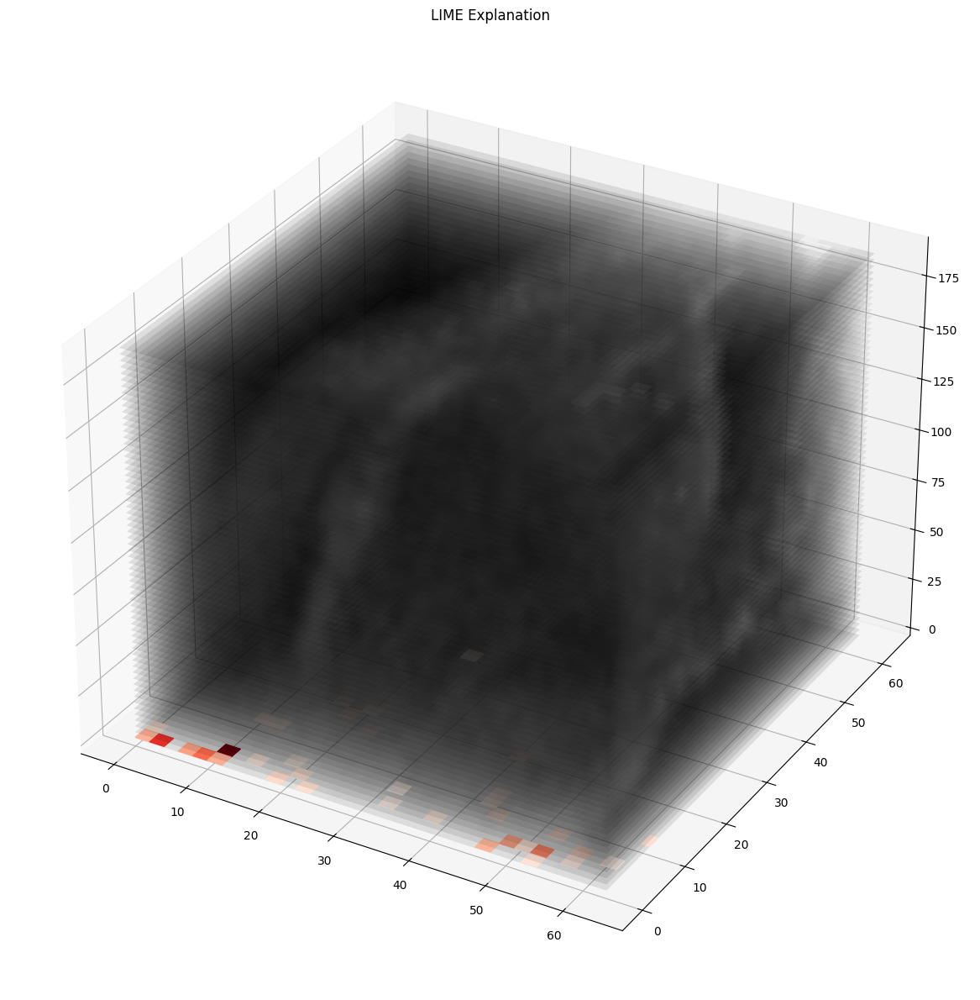

In [6]:
atributions_minimal_value = lime_explanations.cpu().max() * 0.02

display_explainibility(EXAMPLE.squeeze(0).cpu(), 
                       lime_explanations.cpu().squeeze(0).squeeze(0), 
                       title="LIME Explanation", 
                       atributions_minimal_value=atributions_minimal_value,
                       z_slize_size=3)

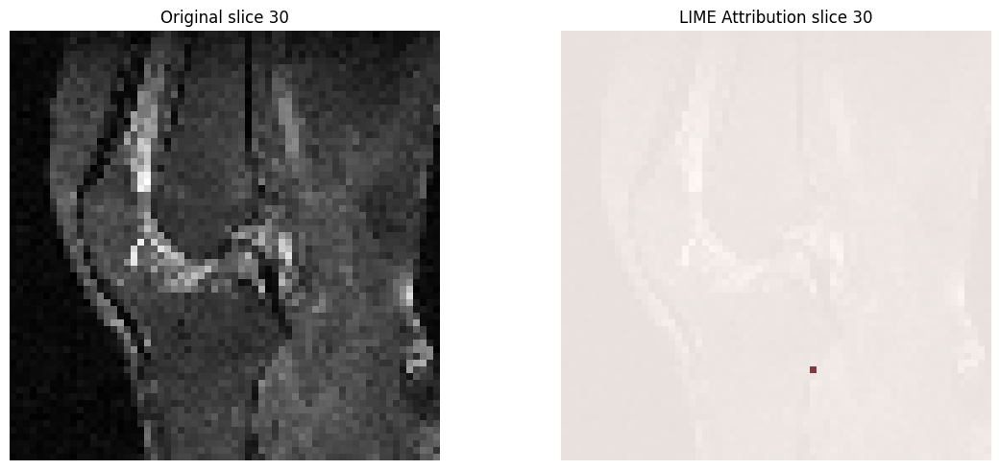

Slice 30:
  Example max: 1819.0000
  LIME max: 1.978225
  LIME > 0: 1 pixels


In [ ]:
import matplotlib.pyplot as plt

# Wybierz numer warstwy Z (0-63)
z_slice = 30

example_2d = EXAMPLE.squeeze(0).cpu().numpy()[z_slice]
lime_2d = lime_explanations.cpu().squeeze(0).squeeze(0).numpy()[z_slice]

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].imshow(example_2d, cmap='gray')
axes[0].set_title(f'Original slice {z_slice}')
axes[0].axis('off')

axes[1].imshow(example_2d, cmap='gray', alpha=0.3)
axes[1].imshow(lime_2d, cmap='Reds', alpha=0.7)
axes[1].set_title(f'LIME Attribution slice {z_slice}')
axes[1].axis('off')

plt.tight_layout()
plt.show()

print(f"Slice {z_slice}:")
print(f"  Example max: {example_2d.max():.4f}")
print(f"  LIME max: {lime_2d.max():.6f}")
print(f"  LIME > 0: {(lime_2d > 0).sum()} pixels")

# Basic Gradinet Methods

/home/bartek/Projekty_WSL/SIGK/Knee-injury-scanner/src/explainibility/basic_gradient_based_methods.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input_tensor = torch.tensor(example, dtype=torch.float32).unsqueeze(0)
/home/bartek/Projekty_WSL/TWM/.venv/lib/python3.12/site-packages/captum/attr/_core/saliency.py:129: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/home/bartek/Projekty_WSL/SIGK/Knee-injury-scanner/src/explainibility/basic_gradient_based_methods.py:35: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input_tensor = torch.tensor(example, dtype=torch.float3

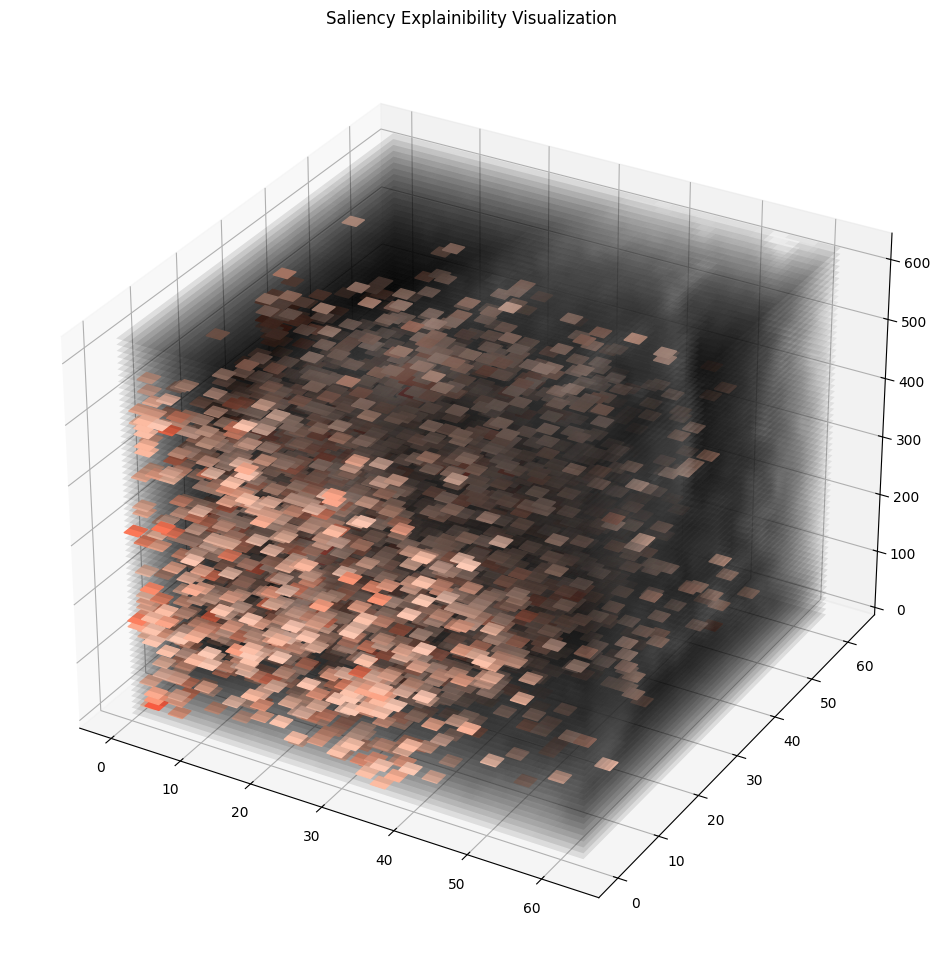

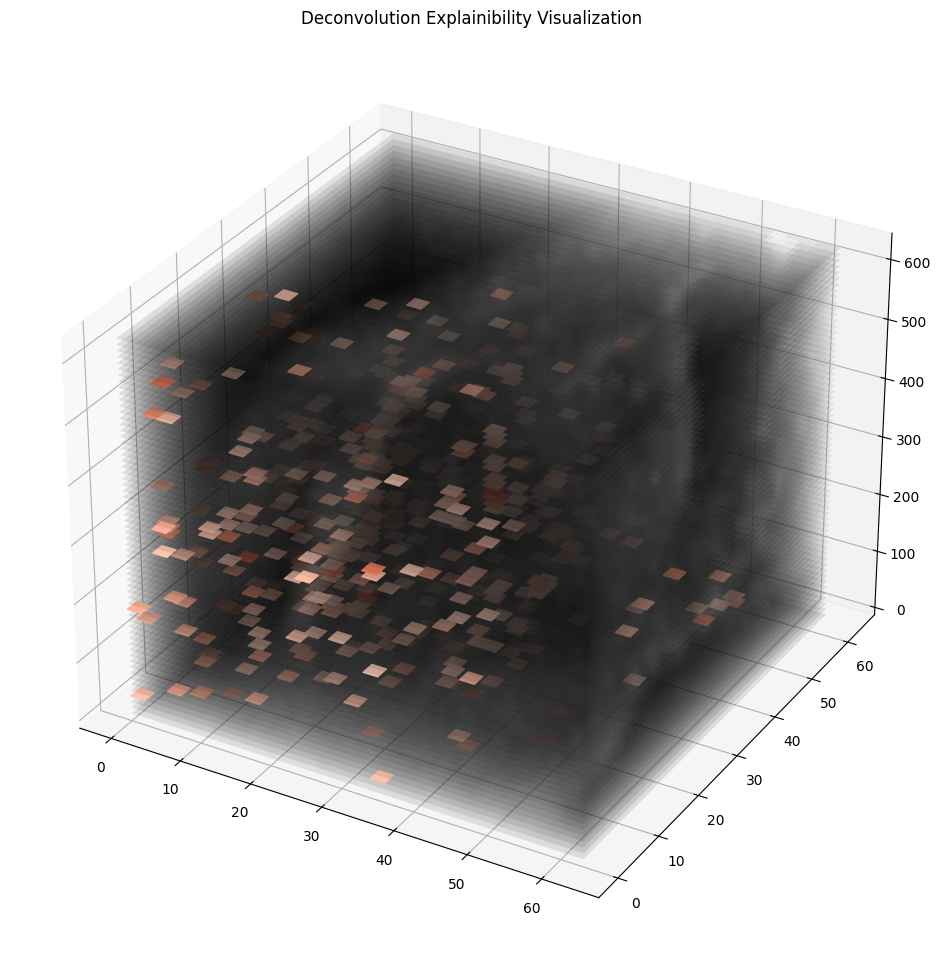

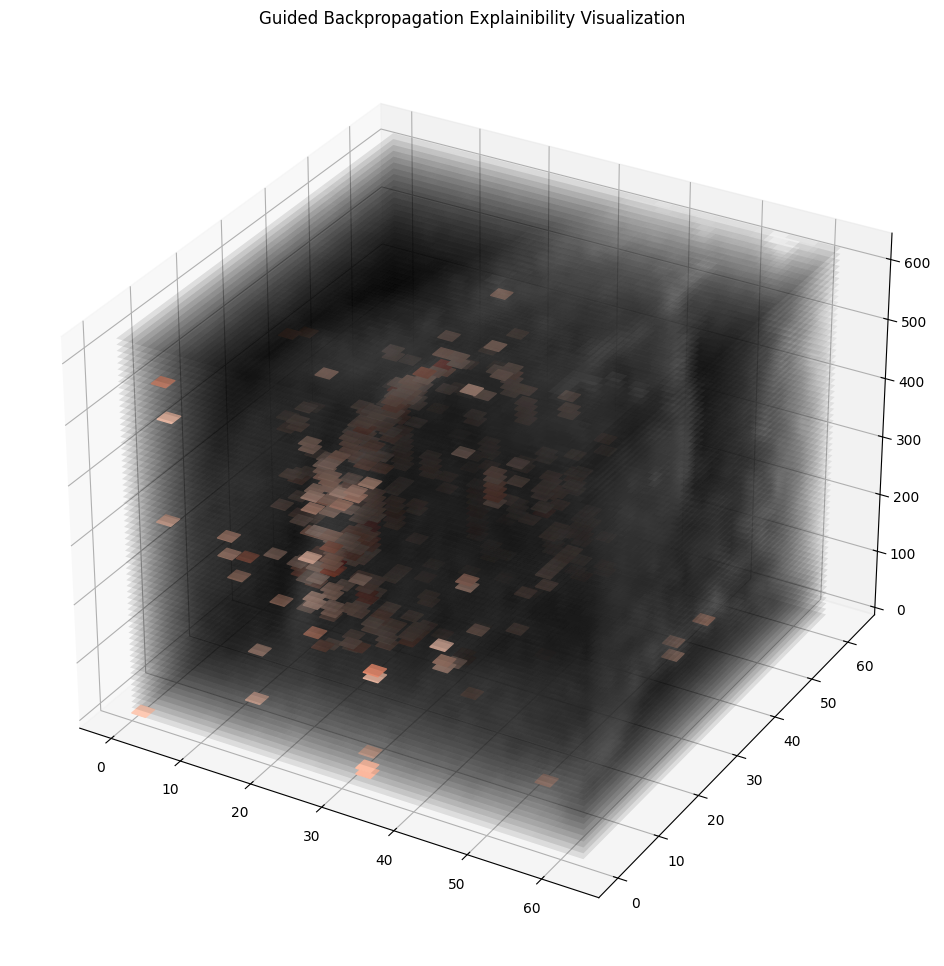

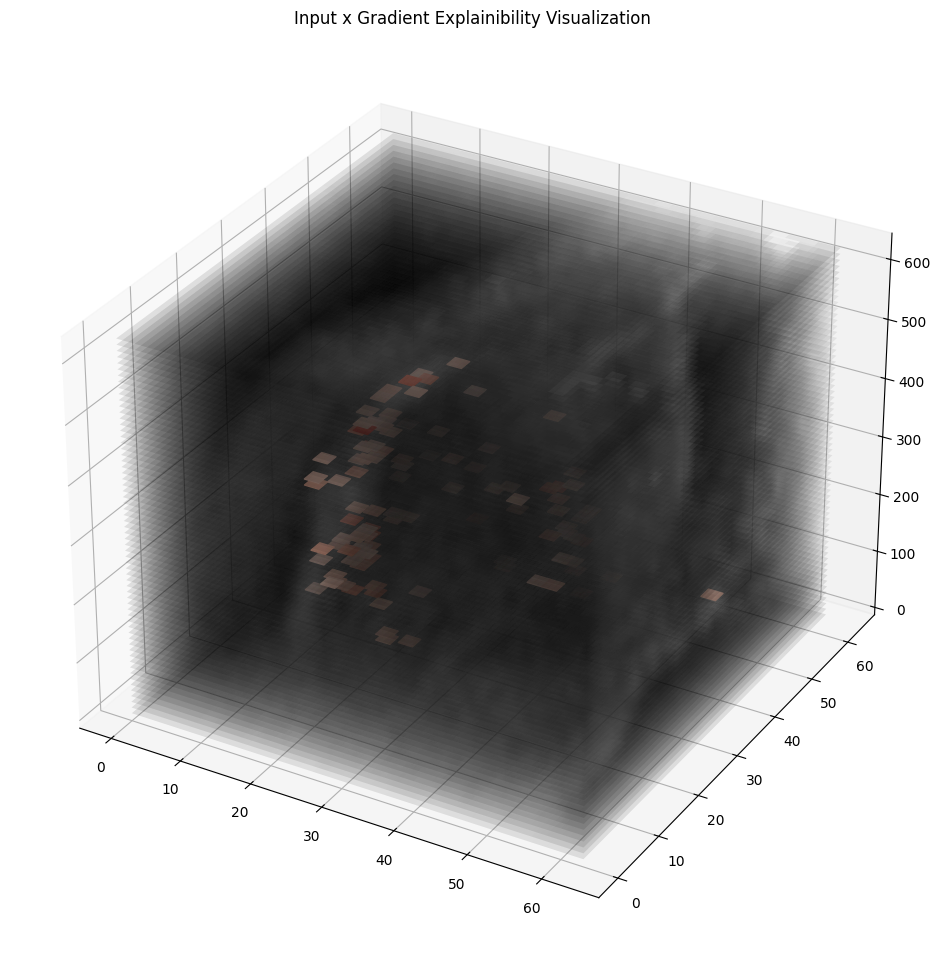

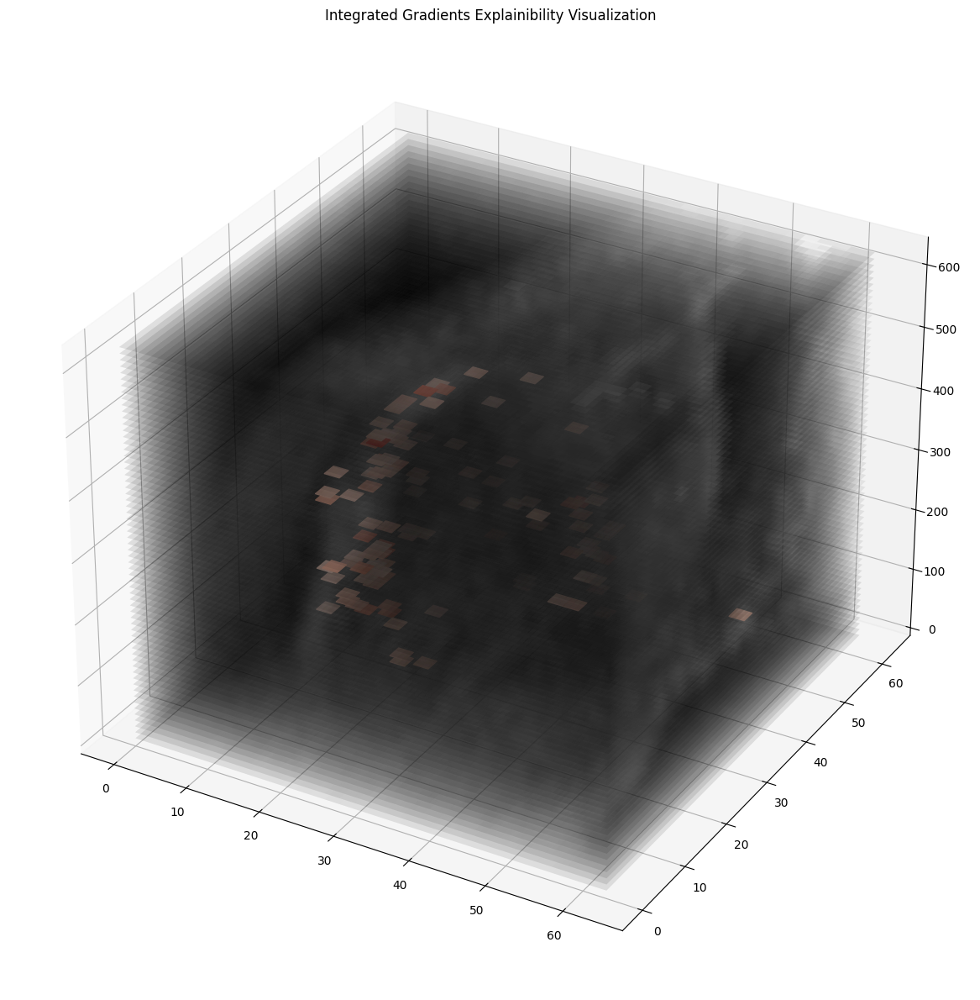

In [13]:
dislay_all_explainibility(MODEL, EXAMPLE, EXAMPLE_CLASS, device)

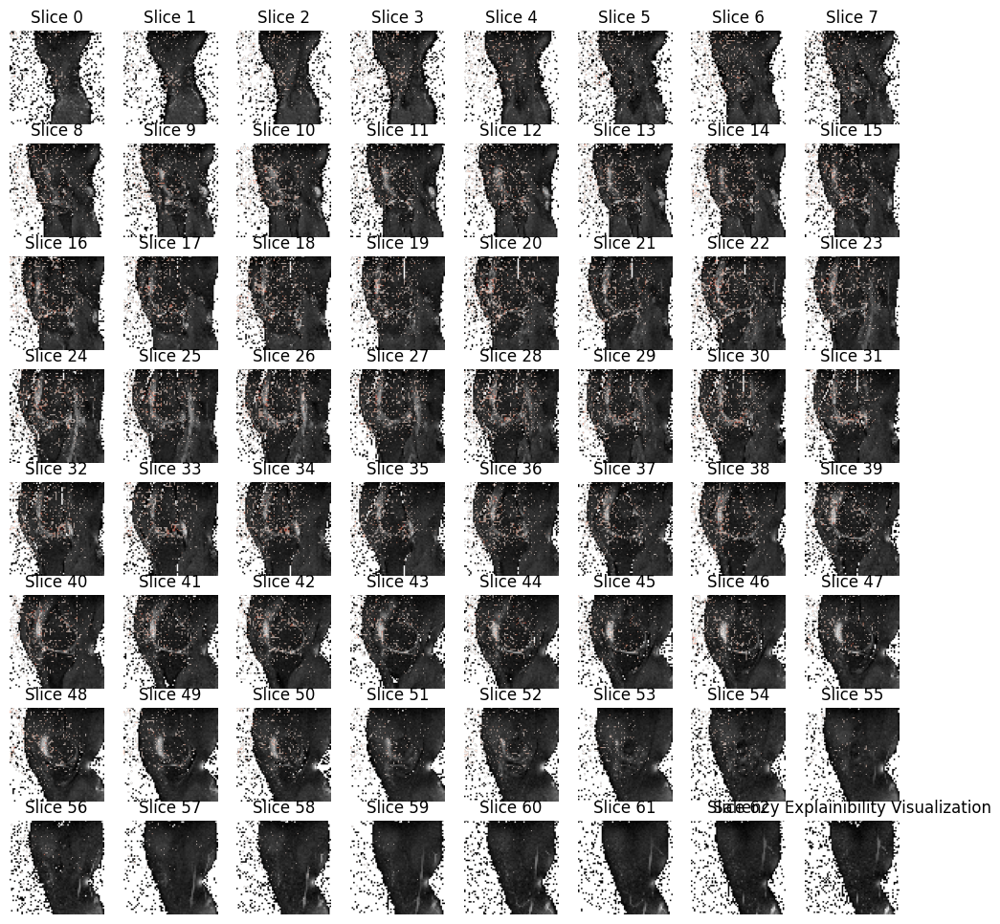

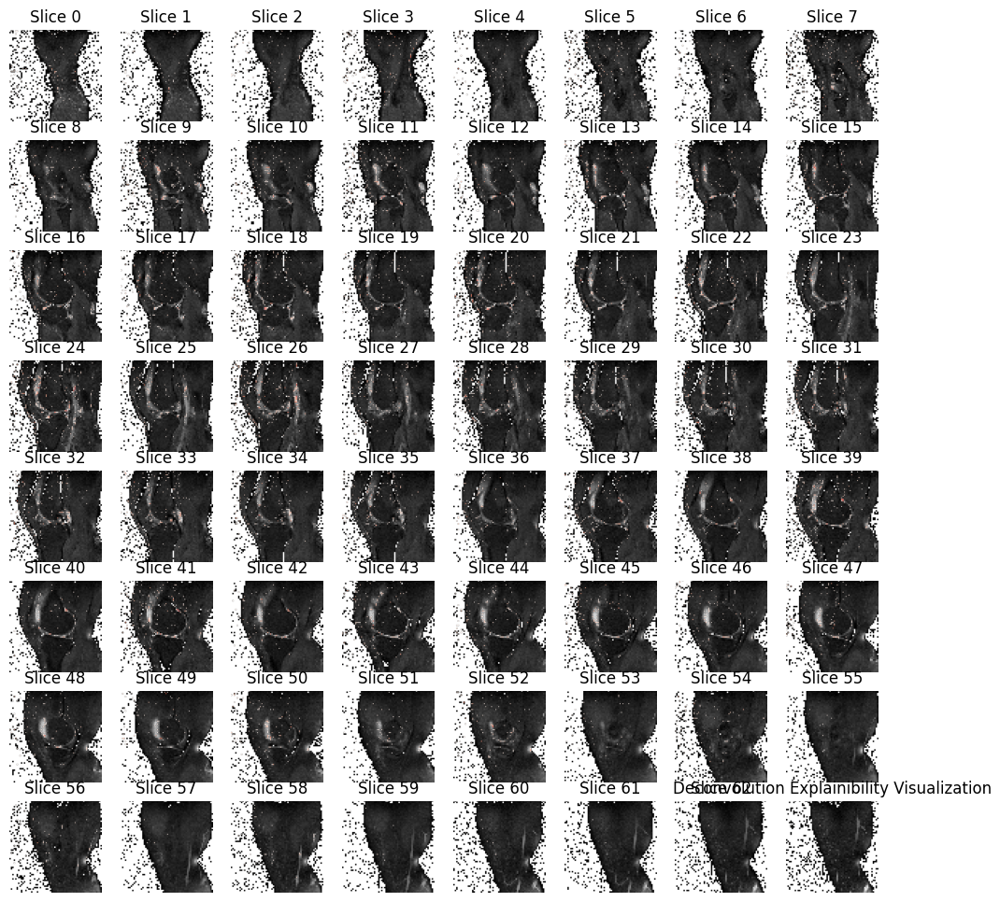

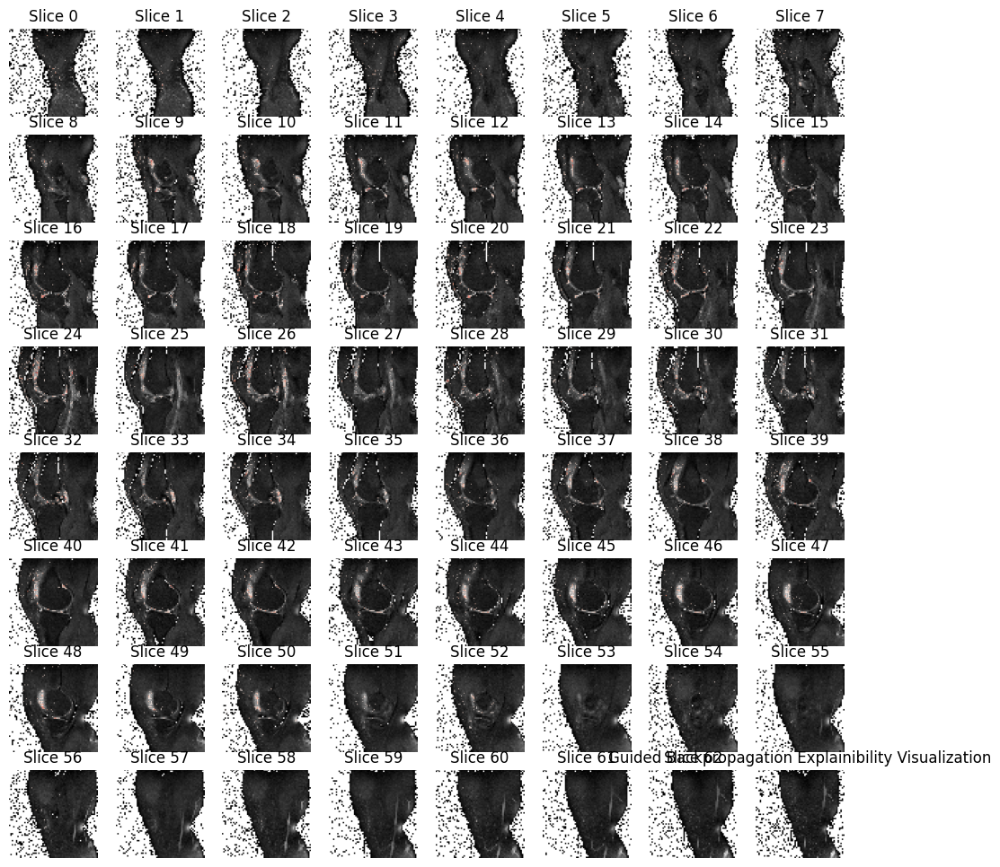

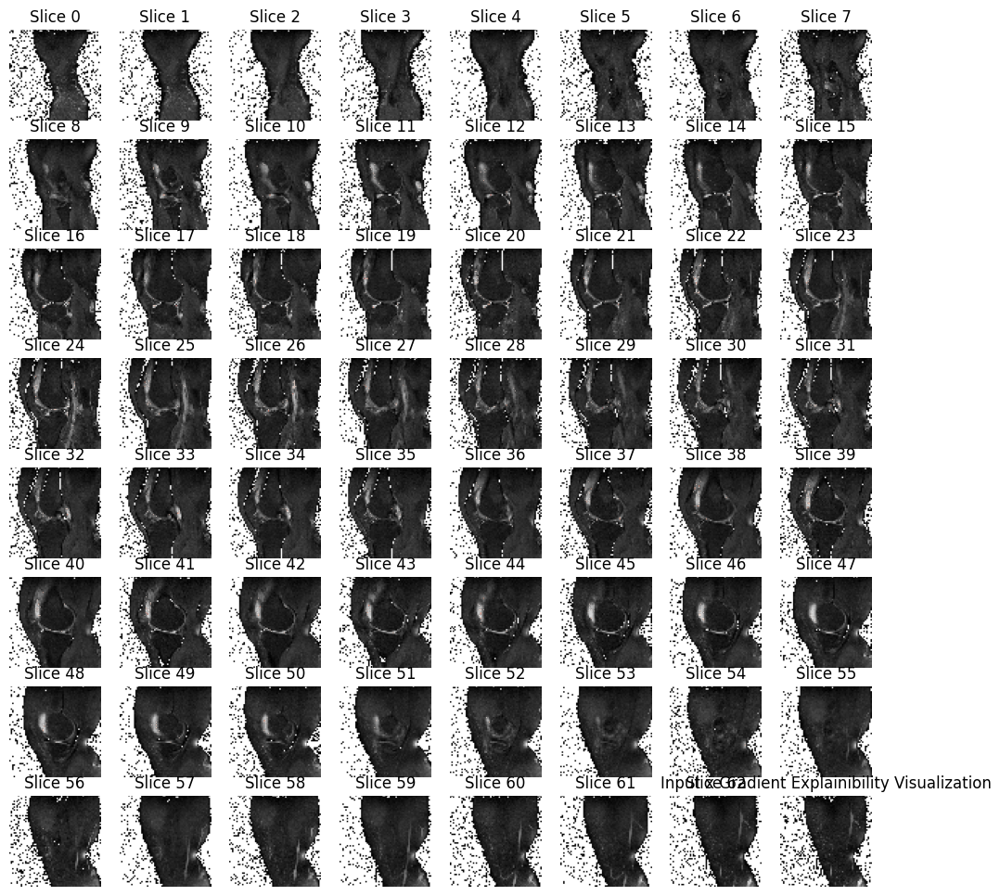

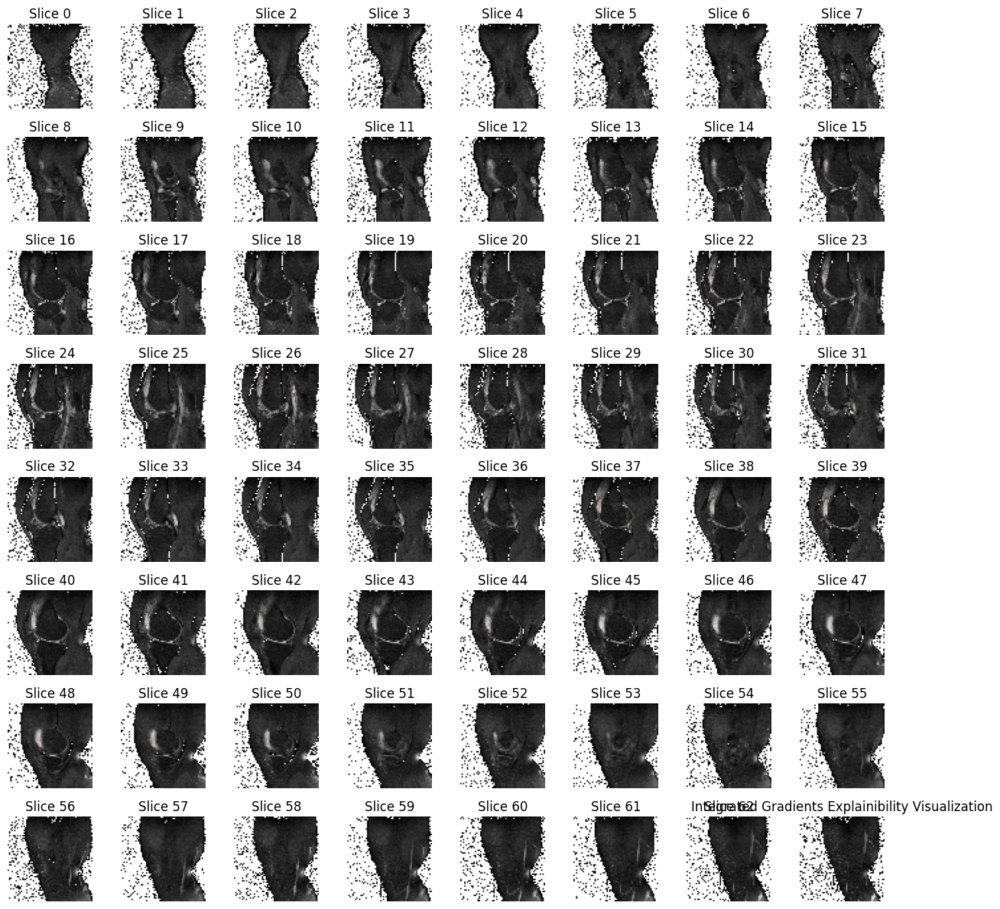

In [14]:
dislay_all_explainibility(MODEL, EXAMPLE, EXAMPLE_CLASS, device, in_slices=True)

# GradCam

In [ ]:
display_grad_cam_explanattions(MODEL, LAYER_TO_EXPLAIN, EXAMPLE, EXAMPLE_CLASS, device)

In [ ]:
display_grad_cam_explanattions(MODEL, LAYER_TO_EXPLAIN, EXAMPLE, EXAMPLE_CLASS, device, in_slices=True)

# SAE

In [4]:
sae_model = explain_model_with_sae(
        MODEL, DATASET, LAYER_TO_EXPLAIN, LAYER_SIZE, hidden_size=4 * 8192, max_number_of_hidden_features=2 * 8192, num_of_epochs=15, learning_rate=0.0008
    )

sae_features, feature_popularity_order_per_class, feature_counts_per_class = sae_statistics(sae_model, MODEL, LAYER_TO_EXPLAIN, DATASET)

torch.jit.save(torch.jit.script(sae_model), str(Path.home() / "sae_explainibility_model.pt"))



Epoch 1/15, Loss: 2.2544, sparsity_losss: 0.2621 
Activation rate: 0.0000
current max hidden features: 32768
Epoch 2/15, Loss: 0.9388, sparsity_losss: 0.2621 
Activation rate: 0.0000
current max hidden features: 30037
Epoch 3/15, Loss: 0.8965, sparsity_losss: 0.2621 
Resampling 297 dead neurons...
Activation rate: 0.0000
current max hidden features: 27306
Epoch 4/15, Loss: 0.8576, sparsity_losss: 0.2621 
Resampling 750 dead neurons...
Activation rate: 0.0000
current max hidden features: 24576
Epoch 5/15, Loss: 0.8217, sparsity_losss: 0.2621 
Resampling 1498 dead neurons...
Activation rate: 0.0000
current max hidden features: 21845
Epoch 6/15, Loss: 0.7905, sparsity_losss: 0.2621 
Resampling 2558 dead neurons...
Activation rate: 0.0000
current max hidden features: 19114
Epoch 7/15, Loss: 0.7626, sparsity_losss: 0.2621 
Resampling 4161 dead neurons...
Activation rate: 0.0000
current max hidden features: 16384
Epoch 8/15, Loss: 0.7381, sparsity_losss: 0.2621 
Resampling 6606 dead neurons.

In [5]:
generated_trees = get_minimal_tree_from_sae_model(sae_model, MODEL, LAYER_TO_EXPLAIN, DATASET)
print(generated_trees)

{5: (0.7975543478260869, RandomForestClassifier(max_depth=5), array([26890,  7588, 19697, 30194, 21495,  8479,  3088, 13382,  4006,
       28682])), 6: (0.8342391304347826, RandomForestClassifier(max_depth=6), array([10133, 13382,  9040, 18917,  1119, 30670, 10356, 15866, 10375,
       24203])), 7: (0.8831521739130435, RandomForestClassifier(max_depth=7), array([21502, 14855,  4912, 29991,  3669, 15560, 15270, 11973, 13304,
       10826])), 8: (0.9402173913043478, RandomForestClassifier(max_depth=8), array([ 2770,  6518, 22251,  5517, 14524,  7967,  2942, 28704,  1119,
       12896])), 9: (0.9592391304347826, RandomForestClassifier(max_depth=9), array([ 7244, 26457, 23419, 18485, 23488,  9045, 11224,   918, 28949,
        5607])), 10: (0.9782608695652174, RandomForestClassifier(max_depth=10), array([ 5517,  3202, 21057,  9695, 16602,   918,  1777, 21309, 24787,
        6518])), 11: (0.9891304347826086, RandomForestClassifier(max_depth=11), array([22426, 29542, 10292, 24787, 30456, 1037

In [6]:
print("Most popular features per class:")
for class_label, feature_order in feature_popularity_order_per_class.items():
    print(f"Class {class_label}: Features {feature_order[:10]}")

Most popular features per class:
Class 0: Features [22002 19294 19293 19292  7348 19284 19283 19282  7343 19276]
Class 1: Features [16383 19111  7644 19110 19109 19108  7648 19107 19106 19097]
Class 2: Features [16383 18723  7748 18721 18720 18718 18717 18716  7754 18724]


In [7]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfTransformer

df = pd.DataFrame.from_dict(feature_counts_per_class, orient="index")
df.columns = [f"feature_{i}" for i in range(df.shape[1])]

transformer = TfidfTransformer()
tfidf_matrix = transformer.fit_transform(df.values).toarray()
tfidf_df = pd.DataFrame(tfidf_matrix, index=df.index, columns=df.columns)

for class_name in sorted(tfidf_df.index):
    print(f"\n--- Top features for {class_name} ---")
    top_features = tfidf_df.loc[class_name].nlargest(10)
    print(top_features)


--- Top features for 0 ---
feature_10    0.00819
feature_11    0.00819
feature_12    0.00819
feature_13    0.00819
feature_15    0.00819
feature_27    0.00819
feature_28    0.00819
feature_29    0.00819
feature_34    0.00819
feature_43    0.00819
Name: 0, dtype: float64

--- Top features for 1 ---
feature_3     0.008193
feature_10    0.008193
feature_11    0.008193
feature_12    0.008193
feature_13    0.008193
feature_15    0.008193
feature_27    0.008193
feature_28    0.008193
feature_29    0.008193
feature_34    0.008193
Name: 1, dtype: float64

--- Top features for 2 ---
feature_10    0.008188
feature_11    0.008188
feature_12    0.008188
feature_13    0.008188
feature_15    0.008188
feature_27    0.008188
feature_28    0.008188
feature_29    0.008188
feature_30    0.008188
feature_34    0.008188
Name: 2, dtype: float64


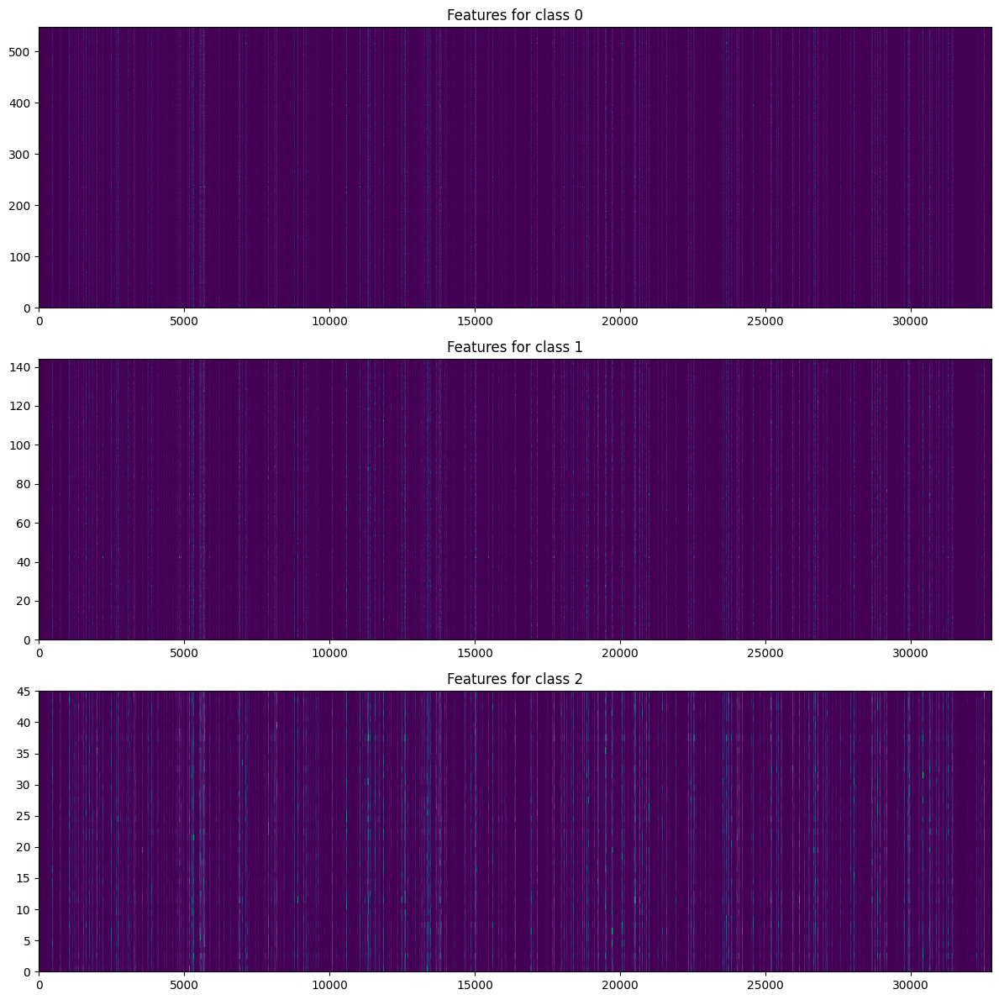

In [8]:
display_sae_features(sae_features, Path(""))